In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from pathlib import Path

script_dir = (Path.cwd().parents[0]/'Zd_visualizations_for_val').resolve()
script_dir, script_dir.exists()

(PosixPath('/mnt/trappist-r0/cmarshak/dist-s1-research/marshak/Zd_visualizations_for_val'),
 True)

In [3]:
sys.path.insert(0, str(script_dir))

import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from dist_plot import get_dist_s1_mpl_cmap
from earthaccess_utils import earthaccess_opera_geo_search, flatten_earthaccess_result, read_multiple_earthdata_urls, convert_asf_url_to_cumulus
from dist_s1.constants import DIST_STATUS_CMAP
from dist_plot import add_dist_s1_colorbar
from distmetrics.despeckle import despeckle_rtc_arrs_with_tv
from shapely.geometry import box
from matplotlib.colors import ListedColormap, BoundaryNorm
from rasterio.plot import show
from basemaps import get_basemap_for_matplotlib, get_basemap_for_rasterio
from gif import pngs_to_gif
from dist_s1_enumerator import get_mgrs_burst_lut
from tqdm import tqdm
import img2pdf
from matplotlib.lines import Line2D
from dist_s1.data_models.data_utils import get_acquisition_datetime, get_track_number, get_burst_id
from dotenv import load_dotenv
import os
from dist_s1_enumerator import enumerate_one_dist_s1_product
from dem_stitcher.rio_window import read_raster_from_window
from wand.image import Image
from rasterio.plot import show


/mnt/trappist-r0/cmarshak/mambaforge/envs/dist-s1-env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
load_dotenv()
DIST_S1_DATA_DIR = Path(os.getenv("DIST_EVENT_DATA"))

In [5]:
[d.name for d in (DIST_S1_DATA_DIR.glob('*/'))][:3]

['afghanistan_flood_2024__42SWF__2024-05-11',
 'attica_fire_2024__34SGH__2024-08-11',
 'bangladesh_coastal_flood_2024__45QYE__2024-07-08']

In [6]:
EVENT_DIR_NAME = 'los_angeles_fires_2025__11SLT__2025-01-04'
EVENT_DIR = DIST_S1_DATA_DIR / EVENT_DIR_NAME
EVENT_DIR.exists()

True

In [7]:
extent = (-118.75, 34.003, -118.487, 34.152)
window_geo = box(*extent)

In [8]:
status_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-DIST-STATUS.tif'))
status_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1_GEN-DIST-STATUS.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1_GEN-DIST-STATUS.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1_GEN-DIST-STATUS.tif')]

In [9]:
acq_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-DIST-STATUS-ACQ.tif'))
acq_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1_GEN-DIST-STATUS-ACQ

In [10]:
metric_files = sorted(Path(f'{EVENT_DIR}').rglob('OPERA*GEN-METRIC.tif'))
metric_files[:3]

[PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T015842Z_20251114T013425Z_S1A_30_v0.1_GEN-METRIC.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241209T140101Z_20251114T012950Z_S1A_30_v0.1_GEN-METRIC.tif'),
 PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20241216T015033Z_20251114T012934Z_S1A_30_v0.1_GEN-METRIC.tif')]

In [11]:
dist_s1_dates = list(map(get_acquisition_datetime, metric_files))
dist_s1_dates[:10]

[Timestamp('2024-12-09 01:58:42+0000', tz='UTC'),
 Timestamp('2024-12-09 14:01:01+0000', tz='UTC'),
 Timestamp('2024-12-16 01:50:33+0000', tz='UTC'),
 Timestamp('2024-12-16 13:52:49+0000', tz='UTC'),
 Timestamp('2024-12-21 01:58:41+0000', tz='UTC'),
 Timestamp('2024-12-21 14:01:00+0000', tz='UTC'),
 Timestamp('2024-12-28 01:50:32+0000', tz='UTC'),
 Timestamp('2024-12-28 13:52:48+0000', tz='UTC'),
 Timestamp('2025-01-02 01:58:40+0000', tz='UTC'),
 Timestamp('2025-01-02 14:00:58+0000', tz='UTC')]

In [12]:
idx = [idx for idx, dt in enumerate(dist_s1_dates) if dt.date() > pd.Timestamp('2025-01-21').date()][0]
idx

16

In [13]:
metric_path = metric_files[idx]
metric_path


PosixPath('/mnt/trappist-r0/cmarshak/opera-dist-s1-validation-data/events/confirmed_products_dist-event-nov/los_angeles_fires_2025__11SLT__2025-01-04/11SLT/OPERA_L3_DIST-ALERT-S1_T11SLT_20250126T015838Z_20251114T013543Z_S1A_30_v0.1/OPERA_L3_DIST-ALERT-S1_T11SLT_20250126T015838Z_20251114T013543Z_S1A_30_v0.1_GEN-METRIC.tif')

In [14]:
metric_arr, p = read_raster_from_window(metric_path, extent) 

Text(0, 0.5, 'Metric')

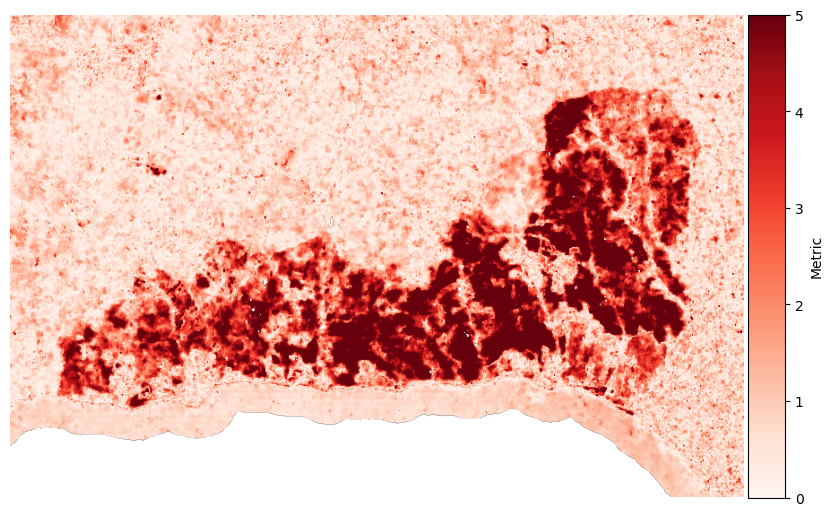

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10))

im = ax.imshow(metric_arr[0, ...], vmin=0, vmax=5, cmap='Reds')
ax.axis('off')

# Create a divider for the axes to position colorbar precisely
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax=cax)
cax.set_ylabel('Metric')

In [16]:
with rasterio.open(metric_path) as src:
    tags = src.tags()
    print(tags)
tags['post_rtc_opera_ids'][:100]


{'algo_config_path': 'None', 'apply_despeckling': 'True', 'apply_logit_to_inputs': 'True', 'apply_water_mask': 'True', 'batch_size_for_norm_param_estimation': '32', 'bucket': 'hyp3-tibet-jpl-test-contentbucket-hratibh1y9pa', 'bucket_prefix': '3afbe568-fc70-4aad-9769-eed8f6948a5c', 'confirmation_confidence_threshold': '22.5', 'confirmation_confidence_upper_lim': '1000', 'delta_lookback_days_mw': '1095,730,365', 'device': 'cpu', 'dst_dir': 'out', 'exclude_consecutive_no_dist': '1', 'high_confidence_alert_threshold': '4.5', 'input_data_dir': 'out', 'interpolation_method': 'bilinear', 'lookback_strategy': 'multi_window', 'low_confidence_alert_threshold': '2.5', 'max_obs_num_year': '253', 'max_pre_imgs_per_burst_mw': '3,3,4', 'memory_strategy': 'high', 'metric_value_upper_lim': '10.0', 'mgrs_tile_id': '11SLT', 'model_cfg_path': 'None', 'model_compilation': 'False', 'model_context_length': '10', 'model_dtype': 'float32', 'model_source': 'transformer_optimized', 'model_wts_path': 'None', 'no_

'OPERA_L2_RTC-S1_T137-292311-IW3_20250126T015838Z_20250126T071247Z_S1A_30_v1.0,OPERA_L2_RTC-S1_T137-2'

In [17]:
df_prod = enumerate_one_dist_s1_product('11SLT', track_number=137, post_date='2025-01-26')

Searching for post-images for track 137 in MGRS tile 11SLT


/tmp/ipykernel_1001749/1141969104.py:1: DeprecationWarning: Parsing dates involving a day of month without a year specified is ambiguious
and fails to parse leap day. The default behavior will change in Python 3.15
to either always raise an exception or to use a different default year (TBD).
To avoid trouble, add a specific year to the input & format.
See https://github.com/python/cpython/issues/70647.
  df_prod = enumerate_one_dist_s1_product('11SLT', track_number=137, post_date='2025-01-26')


Searching for pre-images for multi_window baseline
Lookback days (365, 730, 1095) and window days 365


Windows:   0%|          | 0/3 [00:00<?, ?it/s]/tmp/ipykernel_1001749/1141969104.py:1: DeprecationWarning: Parsing dates involving a day of month without a year specified is ambiguious
and fails to parse leap day. The default behavior will change in Python 3.15
to either always raise an exception or to use a different default year (TBD).
To avoid trouble, add a specific year to the input & format.
See https://github.com/python/cpython/issues/70647.
  df_prod = enumerate_one_dist_s1_product('11SLT', track_number=137, post_date='2025-01-26')
Windows:  33%|███▎      | 1/3 [00:04<00:09,  4.72s/it]/tmp/ipykernel_1001749/1141969104.py:1: DeprecationWarning: Parsing dates involving a day of month without a year specified is ambiguious
and fails to parse leap day. The default behavior will change in Python 3.15
to either always raise an exception or to use a different default year (TBD).
To avoid trouble, add a specific year to the input & format.
See https://github.com/python/cpython/issues/70

In [18]:
ind_geo = df_prod.geometry.intersects(window_geo)
ind_geo.sum()

np.int64(32)

In [19]:
df_prod['url_copol'] = df_prod['url_copol'].apply(convert_asf_url_to_cumulus)
df_prod['url_crosspol'] = df_prod['url_crosspol'].apply(convert_asf_url_to_cumulus)


In [20]:
df_prod_subset = df_prod[ind_geo].reset_index(drop=True)
df_prod_subset.jpl_burst_id.unique()

array(['T137-292315-IW3', 'T137-292316-IW3'], dtype=object)

In [21]:
df_prod_subset_final = df_prod_subset[df_prod_subset.jpl_burst_id == 'T137-292316-IW3'].reset_index(drop=True)
df_prod_subset_final.head()

,opera_id,jpl_burst_id,acq_dt,acq_date_for_mgrs_pass,polarizations,track_number,pass_id,url_crosspol,url_copol,geometry,mgrs_tile_id,acq_group_id_within_mgrs_tile,track_token,input_category
0,OPERA_L2_RTC-S1_T137-292316-IW3_20231203T01590...,T137-292316-IW3,2023-12-03 01:59:01+00:00,2023-12-03,VV+VH,137,603,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,"POLYGON ((-119.0055 33.95036, -118.09013 34.07...",11SLT,2,137,pre
1,OPERA_L2_RTC-S1_T137-292316-IW3_20231215T01590...,T137-292316-IW3,2023-12-15 01:59:00+00:00,2023-12-15,VV+VH,137,605,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,"POLYGON ((-119.0042 33.95037, -118.08888 34.07...",11SLT,2,137,pre
2,OPERA_L2_RTC-S1_T137-292316-IW3_20231227T01585...,T137-292316-IW3,2023-12-27 01:58:59+00:00,2023-12-27,VV+VH,137,607,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,"POLYGON ((-119.00246 33.95033, -118.0871 34.07...",11SLT,2,137,pre
3,OPERA_L2_RTC-S1_T137-292316-IW3_20240108T01585...,T137-292316-IW3,2024-01-08 01:58:59+00:00,2024-01-08,VV+VH,137,609,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,"POLYGON ((-119.00374 33.95132, -118.0884 34.07...",11SLT,2,137,pre
4,OPERA_L2_RTC-S1_T137-292316-IW3_20240120T01585...,T137-292316-IW3,2024-01-20 01:58:58+00:00,2024-01-20,VV+VH,137,611,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,https://cumulus.asf.earthdatacloud.nasa.gov/OP...,"POLYGON ((-119.00442 33.95029, -118.08906 34.0...",11SLT,2,137,pre


In [22]:
copol_pre_urls = df_prod_subset_final[df_prod_subset_final['input_category'] == 'pre']['url_copol'].tolist()
crosspol_pre_urls = df_prod_subset_final[df_prod_subset_final['input_category'] == 'pre']['url_crosspol'].tolist()
pre_acq_dt = df_prod_subset_final[df_prod_subset_final['input_category'] == 'pre']['acq_dt'].tolist()
copol_pre_urls[:3]

['https://cumulus.asf.earthdatacloud.nasa.gov/OPERA/OPERA_L2_RTC-S1/OPERA_L2_RTC-S1_T137-292316-IW3_20231203T015901Z_20231203T124004Z_S1A_30_v1.0/OPERA_L2_RTC-S1_T137-292316-IW3_20231203T015901Z_20231203T124004Z_S1A_30_v1.0_VV.tif',
 'https://cumulus.asf.earthdatacloud.nasa.gov/OPERA/OPERA_L2_RTC-S1/OPERA_L2_RTC-S1_T137-292316-IW3_20231215T015900Z_20231215T143038Z_S1A_30_v1.0/OPERA_L2_RTC-S1_T137-292316-IW3_20231215T015900Z_20231215T143038Z_S1A_30_v1.0_VV.tif',
 'https://cumulus.asf.earthdatacloud.nasa.gov/OPERA/OPERA_L2_RTC-S1/OPERA_L2_RTC-S1_T137-292316-IW3_20231227T015859Z_20231227T112953Z_S1A_30_v1.0/OPERA_L2_RTC-S1_T137-292316-IW3_20231227T015859Z_20231227T112953Z_S1A_30_v1.0_VV.tif']

In [23]:
copol_post_urls = df_prod_subset_final[df_prod_subset_final['input_category'] == 'post']['url_copol'].tolist()
crosspol_post_urls = df_prod_subset_final[df_prod_subset_final['input_category'] == 'post']['url_crosspol'].tolist()
post_acq_dt = df_prod_subset_final[df_prod_subset_final['input_category'] == 'post']['acq_dt'].tolist()
copol_post_urls


['https://cumulus.asf.earthdatacloud.nasa.gov/OPERA/OPERA_L2_RTC-S1/OPERA_L2_RTC-S1_T137-292316-IW3_20250126T015852Z_20250126T085236Z_S1A_30_v1.0/OPERA_L2_RTC-S1_T137-292316-IW3_20250126T015852Z_20250126T085236Z_S1A_30_v1.0_VV.tif']

In [24]:
vv_arrs_pre, profiles = read_multiple_earthdata_urls(copol_pre_urls, extent=extent)
vh_arrs_pre, _ = read_multiple_earthdata_urls(crosspol_pre_urls, extent=extent)

100%|██████████| 15/15 [00:07<00:00,  2.13it/s]


In [25]:
vv_arrs_post, profiles = read_multiple_earthdata_urls(copol_post_urls, extent=extent)
vh_arrs_post, _ = read_multiple_earthdata_urls(crosspol_post_urls, extent=extent)

100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


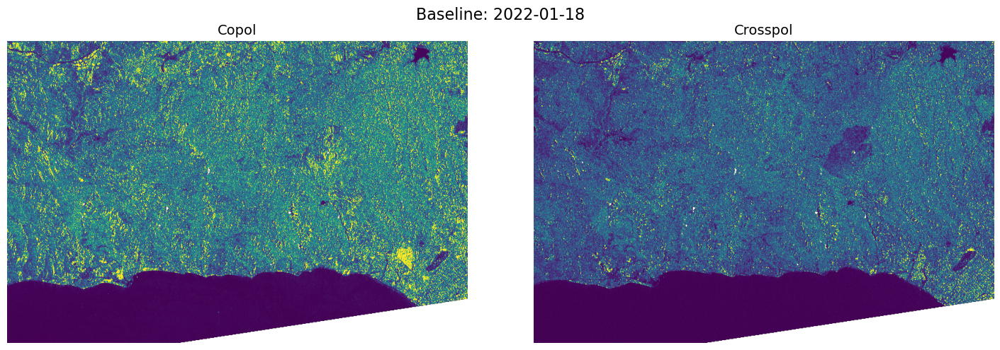

In [26]:
def plot_vv_vh_pre(index: int):
    fig, axs= plt.subplots(1, 2,figsize=(15, 5))

    axs[0].imshow(vv_arrs_pre[index], vmin=0, vmax=.4)
    axs[0].axis('off')
    axs[0].set_title('Copol', fontsize=14)

    axs[1].imshow(vh_arrs_pre[index], vmin=0, vmax=.15)
    axs[1].axis('off')
    axs[1].set_title('Crosspol', fontsize=14)

    fig.suptitle(f'Baseline: {pre_acq_dt[index].strftime("%Y-%m-%d")}', fontsize=16)

    fig.tight_layout()
plot_vv_vh_pre(14)

(None,)

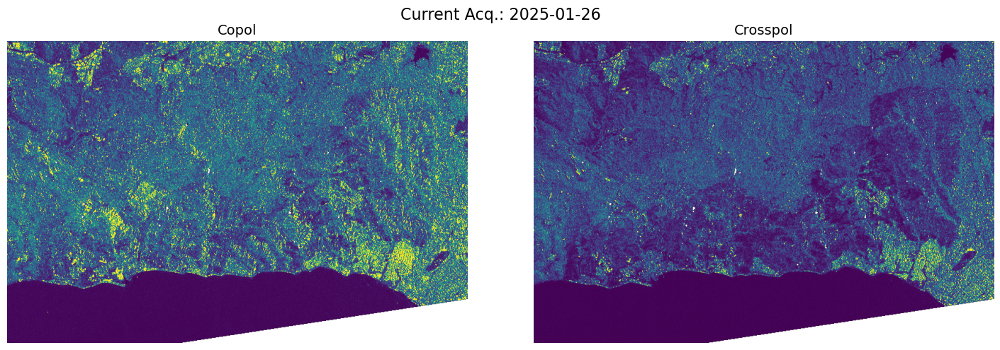

In [27]:
def plot_vv_vh_post():
    fig, axs= plt.subplots(1, 2,figsize=(15, 5))

    axs[0].imshow(vv_arrs_post[0], vmin=0, vmax=.4)
    axs[0].axis('off')
    axs[0].set_title('Copol', fontsize=14)

    axs[1].imshow(vh_arrs_post[0], vmin=0, vmax=.15)
    axs[1].axis('off')
    axs[1].set_title('Crosspol', fontsize=14)

    fig.suptitle(f'Current Acq.: {post_acq_dt[0].strftime("%Y-%m-%d")}', fontsize=16)

    fig.tight_layout()
plot_vv_vh_post(),

In [28]:
out_dir = Path('out/metric_example_la')
out_dir.mkdir(exist_ok=True, parents=True)

pre_png_dir = out_dir / 'png_pre'
pre_png_dir.mkdir(exist_ok=True, parents=True)
post_png_dir = out_dir / 'png_post'
post_png_dir.mkdir(exist_ok=True, parents=True)


  0%|          | 0/15 [00:00<?, ?it/s]

100%|██████████| 15/15 [00:06<00:00,  2.30it/s]


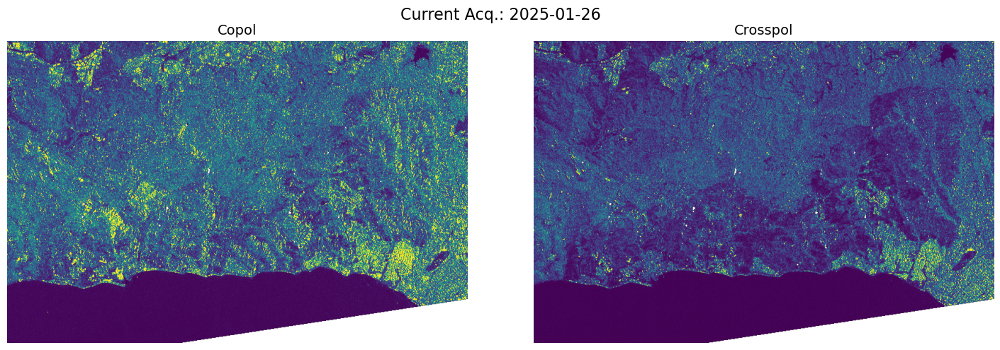

In [29]:
for k in tqdm(range(len(vv_arrs_pre))):
    plot_vv_vh_pre(k)
    plt.savefig(pre_png_dir / f'vv_vh_pre_{k}.png')
    plt.close()


plot_vv_vh_post()
plt.savefig(post_png_dir / 'vv_vh_post.png')

In [30]:
png_paths = sorted(list(pre_png_dir.glob('*.png')))
png_paths[:3]


[PosixPath('out/metric_example_la/png_pre/vv_vh_pre_0.png'),
 PosixPath('out/metric_example_la/png_pre/vv_vh_pre_1.png'),
 PosixPath('out/metric_example_la/png_pre/vv_vh_pre_10.png')]

In [31]:
pngs_to_gif(png_paths, out_dir / 'baseline_los_angeles.gif')


Text(0, 0.5, 'Metric')

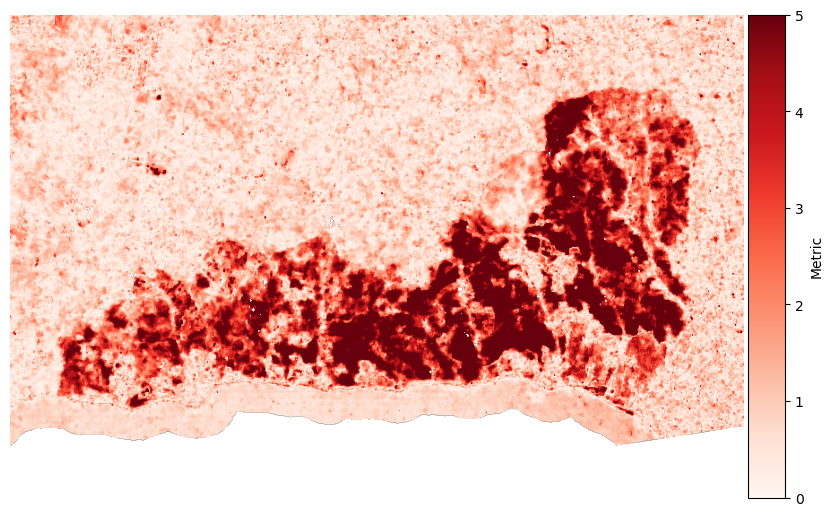

In [32]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10))

metric_plot = metric_arr[0, ...]
metric_plot[np.isnan(vv_arrs_pre[0])] = np.nan
im = ax.imshow(metric_arr[0, ...], vmin=0, vmax=5, cmap='Reds')
ax.axis('off')

# Create a divider for the axes to position colorbar precisely
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax=cax)
cax.set_ylabel('Metric')

(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

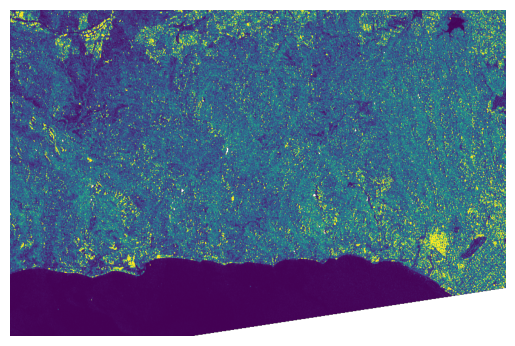

In [33]:
plt.imshow(vv_arrs_pre[0], vmin=0, vmax=.4)
plt.axis('off')



(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

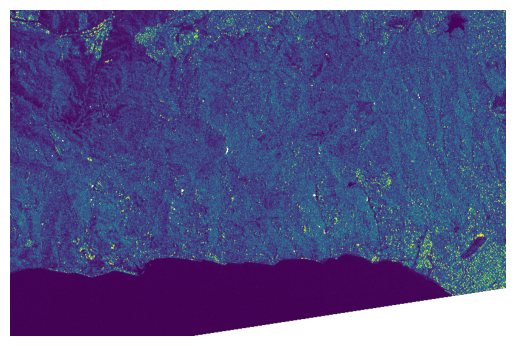

In [34]:
plt.imshow(vh_arrs_pre[0], vmin=0, vmax=.15)
plt.axis('off')



(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

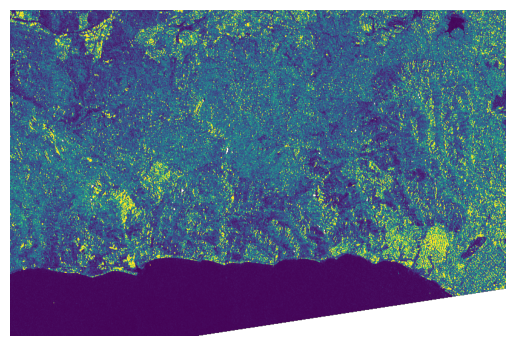

In [35]:
plt.imshow(vv_arrs_post[0], vmin=0, vmax=.4)
plt.axis('off')



(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

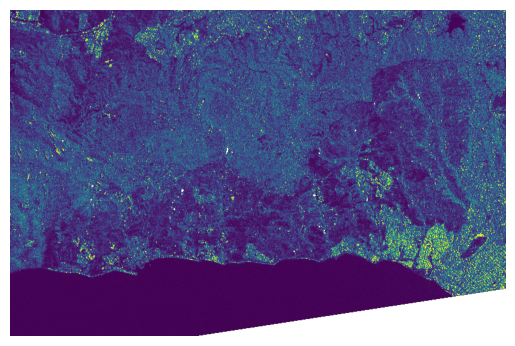

In [36]:
plt.imshow(vh_arrs_post[0], vmin=0, vmax=.15)
plt.axis('off')



In [37]:
# Create Threshold Gif

(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

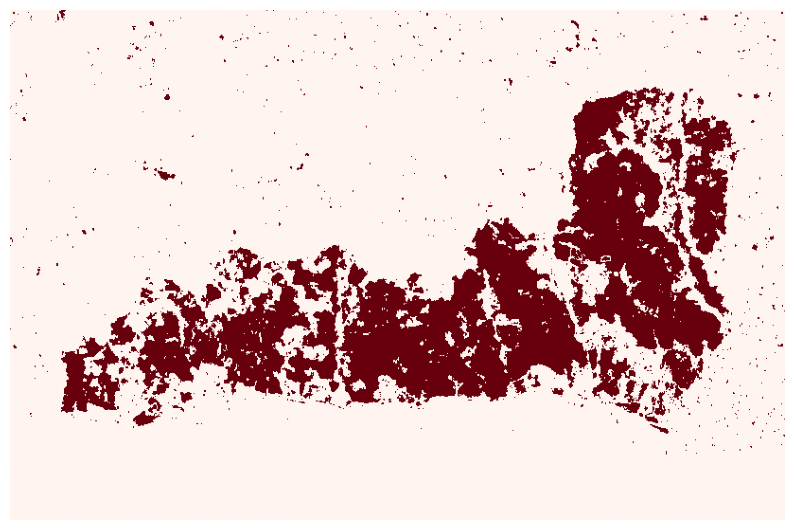

In [38]:
fig, ax = plt.subplots(figsize=(10, 10))


T = 2.5
im = ax.imshow(metric_arr[0, ...]>T, vmin=0, vmax=1, cmap='Reds')
ax.axis('off')

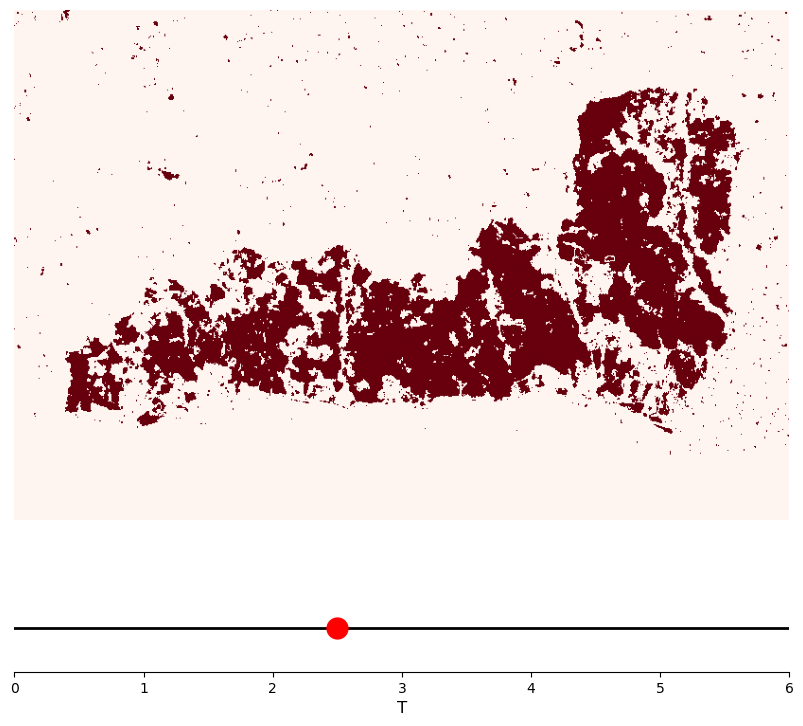

In [39]:
fig, axes = plt.subplots(2, 1, figsize=(10, 11), gridspec_kw={'height_ratios': [10, 1], 'hspace': -.25})

T = 2.5

# Boolean map
ax = axes[0]
im = ax.imshow(metric_arr[0, ...] > T, vmin=0, vmax=1, cmap='Reds')
ax.axis('off')
#ax.set_title(f'Threshold T = {T}', fontsize=14)

# Number line
ax_line = axes[1]
ax_line.set_xlim(0, 6)
ax_line.set_ylim(-0.5, 0.5)
ax_line.axhline(0, color='black', linewidth=2)
ax_line.plot(T, 0, 'o', markersize=15, color='red')
ax_line.set_xticks(np.arange(0, 7, 1))
ax_line.set_yticks([])
ax_line.set_xlabel('T', fontsize=12)
ax_line.spines['top'].set_visible(False)
ax_line.spines['left'].set_visible(False)
ax_line.spines['right'].set_visible(False)


In [40]:
def threshold_png(T: float):
    fig, axes = plt.subplots(2, 1, figsize=(10, 11), gridspec_kw={'height_ratios': [10, 1], 'hspace': -.25})

    # Boolean map
    ax = axes[0]
    im = ax.imshow(metric_arr[0, ...] > T, vmin=0, vmax=1, cmap='Reds')
    ax.axis('off')
    ax.set_title(f'Metric $> T$', fontsize=14)

    # Number line
    ax_line = axes[1]
    ax_line.set_xlim(0, 6)
    ax_line.set_ylim(-0.5, 0.5)
    ax_line.axhline(0, color='black', linewidth=2)
    ax_line.plot(T, 0, 'o', markersize=15, color='red')
    ax_line.set_xticks(np.arange(0, 7, 1))
    ax_line.set_yticks([])
    ax_line.set_xlabel('$T$', fontsize=12)
    ax_line.spines['top'].set_visible(False)
    ax_line.spines['left'].set_visible(False)
    ax_line.spines['right'].set_visible(False)
    return fig, axes


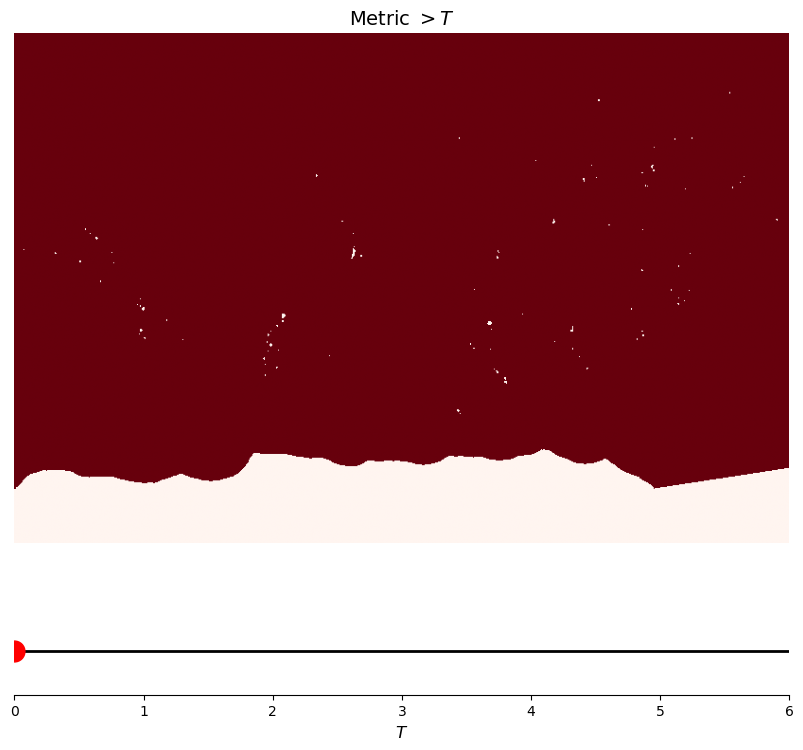

In [41]:
fig, axes = threshold_png(0)

In [42]:
threshold_png_dir = out_dir / 'threshold_pngs'
threshold_png_dir.mkdir(exist_ok=True, parents=True)



In [43]:
ts = np.linspace(0, 6, 30)

for k, t in enumerate(ts):
    fig, axes = threshold_png(t)
    fig.savefig(threshold_png_dir / f'threshold_{t}.png')
    plt.close(fig)

In [44]:
t_pngs = sorted(list(threshold_png_dir.glob('*.png')))
t_pngs[:3]

[PosixPath('out/metric_example_la/threshold_pngs/threshold_0.0.png'),
 PosixPath('out/metric_example_la/threshold_pngs/threshold_0.20689655172413793.png'),
 PosixPath('out/metric_example_la/threshold_pngs/threshold_0.41379310344827586.png')]

In [45]:

pngs_to_gif(t_pngs, out_dir / 'threshold_los_angeles.gif', frame_delay=20)


In [46]:
status_arr, _ = read_raster_from_window(status_files[idx], extent)
acq_arr, _ = read_raster_from_window(acq_files[idx], extent)

In [47]:
dist_cmap, dist_norm = get_dist_s1_mpl_cmap()

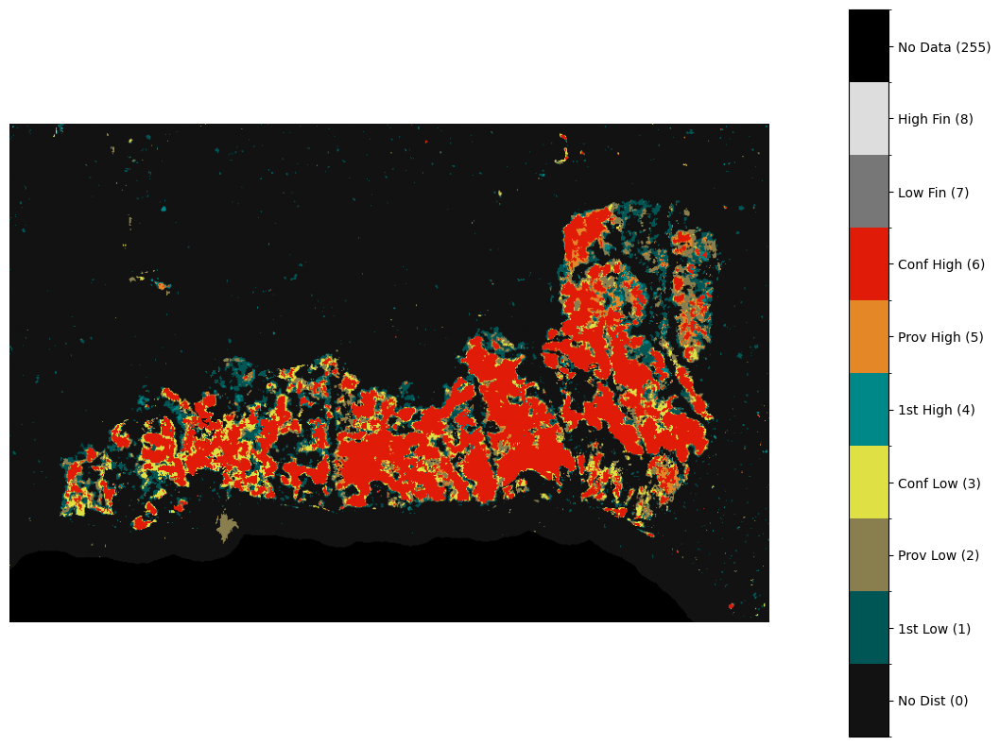

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(12, 10), gridspec_kw={'width_ratios': [.95, 0.05]})
im = axs[0].imshow(status_arr[0, ...], cmap=dist_cmap, norm=dist_norm)
axs[0].axis('off')

add_dist_s1_colorbar(axs[1])

(np.float64(-0.5), np.float64(818.5), np.float64(538.5), np.float64(-0.5))

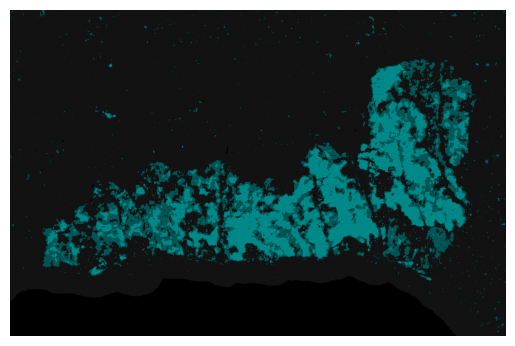

In [49]:
plt.imshow(acq_arr[0, ...], cmap=dist_cmap, norm=dist_norm)
plt.axis('off')


# F1 Score Animation

In [30]:
p = '/mnt/trappist-r0/cmarshak/dist-s1-events/db'
Path(p).exists()

True

In [56]:
df_extent = gpd.read_parquet('/mnt/trappist-r0/cmarshak/dist-s1-events/db/event_extents/los_angeles_fires_2025.parquet')
df_extent.head()



,OBJECTID,poly_SourceOID,poly_IncidentName,poly_FeatureCategory,poly_MapMethod,poly_GISAcres,poly_DeleteThis,poly_FeatureAccess,poly_FeatureStatus,poly_IsVisible,...,attr_ModifiedOnDateTime_dt,attr_Source,attr_IsCpxChild,attr_CpxName,attr_CpxID,attr_SourceGlobalID,GlobalID,attr_IncidentComplexityLevel,geometry,start_time
0,36398,172.0,PALISADES,Wildfire Daily Fire Perimeter,IR Image Interpretation,23448.000000,No,Public,Approved,Yes,...,"Sat, 01 Feb 2025 01:45:24 GMT",IRWIN,0,None,None,{35C19D7C-FEDA-42F8-AD76-9B094E783801},2a11c9e3-3295-4623-8c53-4e9a192ae0f3,Type 3 Incident,"POLYGON ((-118.73577 34.07153, -118.73576 34.0...",2025-01-07 19:23:56
1,36410,615.0,Eaton,Wildfire Daily Fire Perimeter,Mixed Methods,14021.108712,No,Public,Approved,Yes,...,"Wed, 05 Mar 2025 17:44:11 GMT",IRWIN,0,None,None,{72660ADC-B5EF-4D96-A33F-B4EA3740A4E3},52bfca63-1058-40fe-a4b8-ec17b36361c1,Type 4 Incident,"POLYGON ((-118.21186 34.19913, -118.21204 34.2...",2025-01-08 02:22:48
2,36411,312.0,Hurst,Wildfire Daily Fire Perimeter,Mixed Methods,799.817638,No,Public,Approved,Yes,...,"Fri, 17 Jan 2025 01:20:08 GMT",IRWIN,0,None,None,{D69D1FE4-0B5E-43AF-89FF-BD4757EF0DFA},a54b079e-9b60-497f-bbb6-672f21184aa0,Type 3 Incident,"POLYGON ((-118.53555 34.35652, -118.53546 34.3...",2025-01-08 06:53:19
3,36562,510.0,FREDDY,Wildfire Daily Fire Perimeter,GPS-Walked,6.530000,No,Public,Approved,Yes,...,"Wed, 15 Jan 2025 23:20:50 GMT",IRWIN,0,None,None,{5FADAEC7-756F-4614-A42F-B442FB5B65D0},3aaa2e14-bef3-46f2-b2ad-e0f14e95d3be,None,"POLYGON ((-118.94949 33.99677, -118.95194 33.9...",2025-01-08 20:42:48
4,36677,823.0,Laguna,Wildfire Daily Fire Perimeter,Mixed Methods,66.506928,No,Public,Approved,Yes,...,"Fri, 27 Jun 2025 01:41:32 GMT",IRWIN,0,None,None,{AF1F1DA6-6800-4CA1-B7B1-BC7E80265166},d5ce3fef-37b5-4cca-9b85-62edf14092f7,Type 3 Incident,"POLYGON ((-119.10954 34.15443, -119.10994 34.1...",2025-01-23 16:40:22


In [31]:
df_event = gpd.read_parquet('/mnt/trappist-r0/cmarshak/dist-s1-events/db/event_perimeters/los_angeles_fires_2025.parquet')
df_event.head()



,OBJECTID,poly_SourceOID,poly_IncidentName,poly_FeatureCategory,poly_MapMethod,poly_GISAcres,poly_DeleteThis,poly_FeatureAccess,poly_FeatureStatus,poly_IsVisible,...,attr_ModifiedOnDateTime_dt,attr_Source,attr_IsCpxChild,attr_CpxName,attr_CpxID,attr_SourceGlobalID,GlobalID,attr_IncidentComplexityLevel,geometry,start_time
0,36398,172.0,PALISADES,Wildfire Daily Fire Perimeter,IR Image Interpretation,23448.000000,No,Public,Approved,Yes,...,"Sat, 01 Feb 2025 01:45:24 GMT",IRWIN,0,None,None,{35C19D7C-FEDA-42F8-AD76-9B094E783801},2a11c9e3-3295-4623-8c53-4e9a192ae0f3,Type 3 Incident,"MULTIPOLYGON (((-118.56093 34.04408, -118.5609...",2025-01-07 19:23:56
1,36410,615.0,Eaton,Wildfire Daily Fire Perimeter,Mixed Methods,14021.108712,No,Public,Approved,Yes,...,"Wed, 05 Mar 2025 17:44:11 GMT",IRWIN,0,None,None,{72660ADC-B5EF-4D96-A33F-B4EA3740A4E3},52bfca63-1058-40fe-a4b8-ec17b36361c1,Type 4 Incident,"MULTIPOLYGON (((-118.08301 34.23769, -118.0830...",2025-01-08 02:22:48
2,36411,312.0,Hurst,Wildfire Daily Fire Perimeter,Mixed Methods,799.817638,No,Public,Approved,Yes,...,"Fri, 17 Jan 2025 01:20:08 GMT",IRWIN,0,None,None,{D69D1FE4-0B5E-43AF-89FF-BD4757EF0DFA},a54b079e-9b60-497f-bbb6-672f21184aa0,Type 3 Incident,"POLYGON ((-118.47458 34.34255, -118.47434 34.3...",2025-01-08 06:53:19
3,36562,510.0,FREDDY,Wildfire Daily Fire Perimeter,GPS-Walked,6.530000,No,Public,Approved,Yes,...,"Wed, 15 Jan 2025 23:20:50 GMT",IRWIN,0,None,None,{5FADAEC7-756F-4614-A42F-B442FB5B65D0},3aaa2e14-bef3-46f2-b2ad-e0f14e95d3be,None,"POLYGON ((-118.94196 34.04779, -118.94196 34.0...",2025-01-08 20:42:48
4,36677,823.0,Laguna,Wildfire Daily Fire Perimeter,Mixed Methods,66.506928,No,Public,Approved,Yes,...,"Fri, 27 Jun 2025 01:41:32 GMT",IRWIN,0,None,None,{AF1F1DA6-6800-4CA1-B7B1-BC7E80265166},d5ce3fef-37b5-4cca-9b85-62edf14092f7,Type 3 Incident,"POLYGON ((-119.05553 34.16243, -119.05518 34.1...",2025-01-23 16:40:22


In [32]:
profiles[0]['crs']

CRS.from_wkt('PROJCS["WGS 84 / UTM zone 11N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-117],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32611"]]')

In [33]:
df_event_utm = df_event.to_crs(profiles[0]['crs'])
fire_geo = df_event_utm.geometry.union_all()

In [34]:
from rasterio import features

def rasterize_shapes_to_array(
    shapes: list, attributes: list, profile: dict, all_touched: bool = False, dtype: str = np.float32
) -> np.ndarray:
    """
    Takes a list of geometries and attributes to create an array. Roughly the
    inverse, in spirit, to `get_geopandas_features_from_array`.  For example,
    `shapes = df.geometry` and `attributes = df.label`, where df is a geopandas
    GeoDataFrame. We note the array is initialized as array of zeros.

    Parameters
    ----------
    shapes : list
        List of Shapely geometries.
    attributes : list
        List of attributes corresponding to shapes.
    profile : dict
        Rasterio profile in which shapes will be projected into, importantly
        the transform and dimensions specified.
    all_touched : bool
        Whether factionally covered pixels are written with specific value or
        ignored. See `rasterio.features.rasterize`.
    dtype : str
        The initial array is np.zeros and dtype can be specified as a numpy
        dtype or appropriate string.

    Returns
    -------
    np.ndarray:
        The output array determined with profile.
    """
    out_arr = np.zeros((profile["height"], profile["width"]), dtype=dtype)

    # this is where we create a generator of geom, value pairs to use in
    # rasterizing
    shapes = [(geom, value) for geom, value in zip(shapes, attributes)]
    burned = features.rasterize(shapes=shapes, out=out_arr, transform=profile["transform"], all_touched=all_touched)

    return burned


In [35]:
fire_arr = rasterize_shapes_to_array([fire_geo], [1], profiles[0])

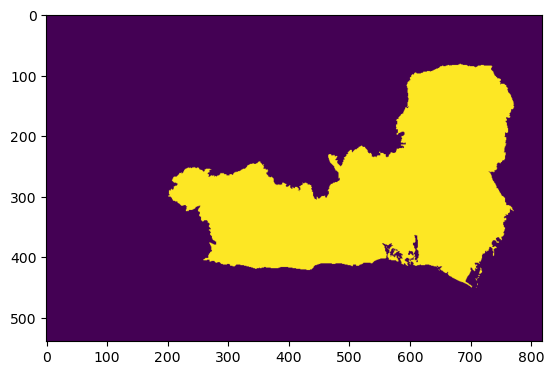

In [36]:
plt.imshow(fire_arr, vmin=0, vmax=1)

In [42]:
df_event.head()

,OBJECTID,poly_SourceOID,poly_IncidentName,poly_FeatureCategory,poly_MapMethod,poly_GISAcres,poly_DeleteThis,poly_FeatureAccess,poly_FeatureStatus,poly_IsVisible,...,attr_ModifiedOnDateTime_dt,attr_Source,attr_IsCpxChild,attr_CpxName,attr_CpxID,attr_SourceGlobalID,GlobalID,attr_IncidentComplexityLevel,geometry,start_time
0,36398,172.0,PALISADES,Wildfire Daily Fire Perimeter,IR Image Interpretation,23448.000000,No,Public,Approved,Yes,...,"Sat, 01 Feb 2025 01:45:24 GMT",IRWIN,0,None,None,{35C19D7C-FEDA-42F8-AD76-9B094E783801},2a11c9e3-3295-4623-8c53-4e9a192ae0f3,Type 3 Incident,"MULTIPOLYGON (((-118.56093 34.04408, -118.5609...",2025-01-07 19:23:56
1,36410,615.0,Eaton,Wildfire Daily Fire Perimeter,Mixed Methods,14021.108712,No,Public,Approved,Yes,...,"Wed, 05 Mar 2025 17:44:11 GMT",IRWIN,0,None,None,{72660ADC-B5EF-4D96-A33F-B4EA3740A4E3},52bfca63-1058-40fe-a4b8-ec17b36361c1,Type 4 Incident,"MULTIPOLYGON (((-118.08301 34.23769, -118.0830...",2025-01-08 02:22:48
2,36411,312.0,Hurst,Wildfire Daily Fire Perimeter,Mixed Methods,799.817638,No,Public,Approved,Yes,...,"Fri, 17 Jan 2025 01:20:08 GMT",IRWIN,0,None,None,{D69D1FE4-0B5E-43AF-89FF-BD4757EF0DFA},a54b079e-9b60-497f-bbb6-672f21184aa0,Type 3 Incident,"POLYGON ((-118.47458 34.34255, -118.47434 34.3...",2025-01-08 06:53:19
3,36562,510.0,FREDDY,Wildfire Daily Fire Perimeter,GPS-Walked,6.530000,No,Public,Approved,Yes,...,"Wed, 15 Jan 2025 23:20:50 GMT",IRWIN,0,None,None,{5FADAEC7-756F-4614-A42F-B442FB5B65D0},3aaa2e14-bef3-46f2-b2ad-e0f14e95d3be,None,"POLYGON ((-118.94196 34.04779, -118.94196 34.0...",2025-01-08 20:42:48
4,36677,823.0,Laguna,Wildfire Daily Fire Perimeter,Mixed Methods,66.506928,No,Public,Approved,Yes,...,"Fri, 27 Jun 2025 01:41:32 GMT",IRWIN,0,None,None,{AF1F1DA6-6800-4CA1-B7B1-BC7E80265166},d5ce3fef-37b5-4cca-9b85-62edf14092f7,Type 3 Incident,"POLYGON ((-119.05553 34.16243, -119.05518 34.1...",2025-01-23 16:40:22


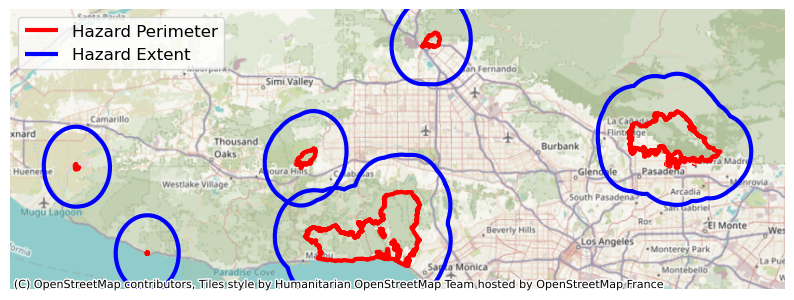

In [ ]:
# import contextily as ctx

# fig, ax = plt.subplots(figsize=(10, 10))

# df_event.boundary.plot(ax=ax, color='red', alpha=1, lw=3, label='Hazard Perimeter')
# df_extent.boundary.plot(ax=ax, color='blue', alpha=1, lw=3, label='Hazard Extent')
# ctx.add_basemap(ax, crs=df_event.crs)

# xmin, ymin, xmax, ymax = df_event.total_bounds
# x_buffer = (xmax - xmin) * 0.1
# y_buffer = (ymax - ymin) * 0.1
# ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
# ax.set_ylim(ymin - y_buffer, ymax + y_buffer)
# ax.axis('off')
# ax.legend(loc='upper left', fontsize=12)


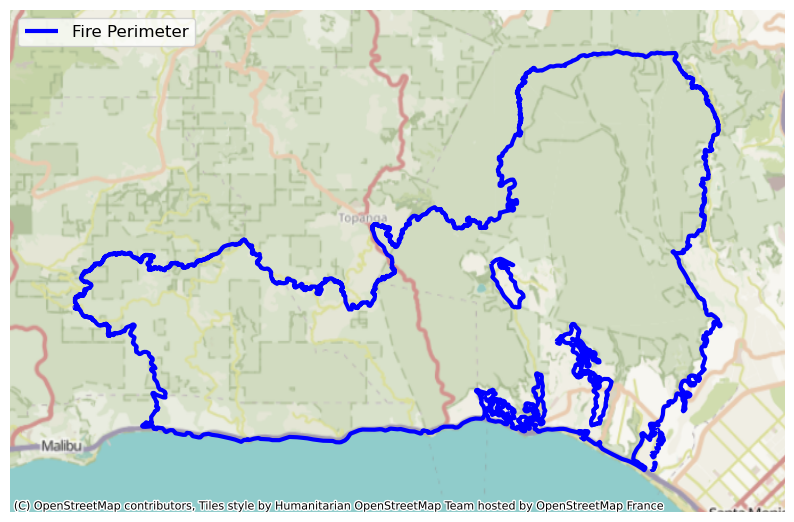

In [61]:
import contextily as ctx

fig, ax = plt.subplots(figsize=(10, 10))

df_palisades = df_event.iloc[:1].copy()
df_palisades.boundary.plot(ax=ax, color='blue', alpha=1, lw=3, label='Fire Perimeter')
ctx.add_basemap(ax, crs=df_palisades.crs, zoom=12)

xmin, ymin, xmax, ymax = df_palisades.total_bounds
x_buffer = (xmax - xmin) * 0.1
y_buffer = (ymax - ymin) * 0.1
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)
ax.axis('off')
ax.legend(loc='upper left', fontsize=12)


In [37]:
# Plot The Fire

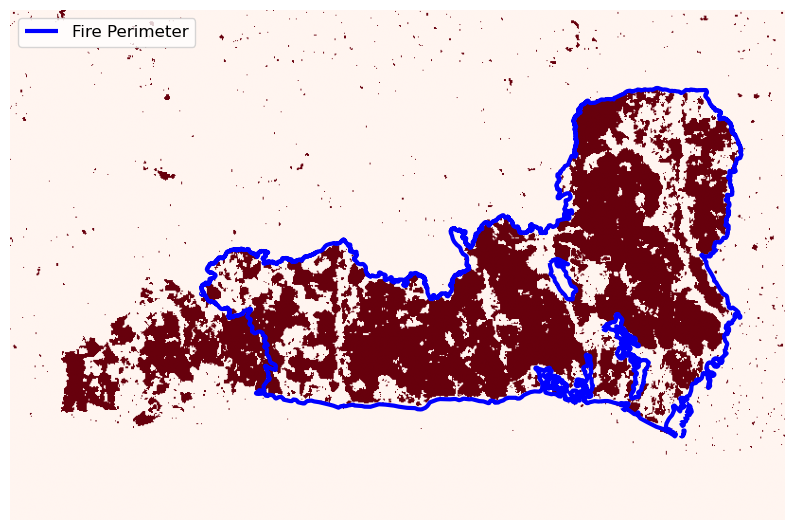

In [116]:
fig, ax = plt.subplots(figsize=(10, 10))

show(metric_arr[0, ...] > 2.5, ax=ax, transform=profiles[0]['transform'], cmap='Reds')
xlim = ax.get_xlim()    
ylim = ax.get_ylim()
df_event_utm_plot = df_event_utm.copy()
df_event_utm_plot.geometry = df_event_utm_plot.geometry.boundary
df_event_utm_plot.plot(ax=ax, color='blue', alpha=1, lw=3, label='Fire Perimeter', legend=True)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.axis('off')
ax.legend(loc='upper left', fontsize=12)

In [ ]:
from sklearn.metrics import f1_score, fbeta_score

In [1]:
def get_dist_labels(metric_arr, T):
    arr = np.zeros_like(metric_arr, dtype=np.uint8)
    arr[metric_arr > T] = 1
    return arr
f1s = [f1_score(fire_arr.astype(np.uint8).ravel(), get_dist_labels(metric_arr[0, ...], t).ravel() , zero_division=0) for t in tqdm(ts)]
fhs = [fbeta_score(fire_arr.astype(np.uint8).ravel(), get_dist_labels(metric_arr[0, ...], t).ravel(), beta=0.5, zero_division=0) for t in tqdm(ts)]

NameError: name 'tqdm' is not defined

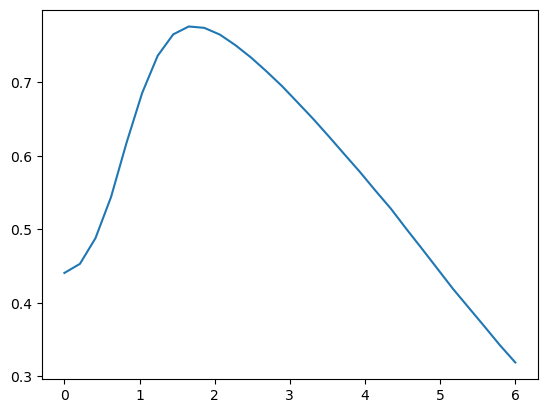

In [136]:
plt.plot(ts, f1s)

In [154]:
def plot_f1_and_threshold(t: float):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Left plot: F1 score curve
    ax_f1 = axes[0]
    ax_f1.plot(ts, f1s, 'b-', linewidth=2)
    
    # Find the F1 score at threshold t (interpolate if needed)
    f1_at_t = np.interp(t, ts, f1s)
    ax_f1.plot(t, f1_at_t, 'ro', markersize=12)
    
    ax_f1.set_xlabel('Threshold $T$', fontsize=12)
    ax_f1.set_ylabel('F1 Score', fontsize=12)
    ax_f1.set_title('F1 Score vs Threshold', fontsize=14)
    ax_f1.grid(True, alpha=0.3)
    
    # Right plot: Thresholded image
    ax_img = axes[1]
    img_data = metric_arr[0, ...] if metric_arr.ndim == 3 else metric_arr
    im = show(img_data > t, ax=ax_img, transform=profiles[0]['transform'], vmin=0, vmax=1, cmap='Reds')
    xlim = ax_img.get_xlim()    
    ylim = ax_img.get_ylim()
    df_event_utm_plot.plot(ax=ax_img, color='blue', alpha=1, lw=3, label='Fire Perimeter', legend=True)
    ax_img.set_xlim(xlim)
    ax_img.set_ylim(ylim)
    ax_img.axis('off')
    ax_img.set_title(f'Metric $> {t:.2f}$', fontsize=14)
    
    fig.tight_layout()
    return fig, axes


In [155]:
f1_png_dir = out_dir / 'f1_pngs'
f1_png_dir.mkdir(exist_ok=True, parents=True)


In [156]:
for k, t in tqdm(enumerate(ts)):
    fig, ax = plot_f1_and_threshold(t)
    fig.savefig(f1_png_dir / f'f1_and_threshold_{t}.png')
    plt.close(fig)

0it [00:00, ?it/s]

30it [00:09,  3.01it/s]


In [ ]:
png_paths = sorted(list(f1_png_dir.glob('*.png')), key=lambda x: int(x.stem.split('_')[-1]))
png_paths[:3]

pngs_to_gif(png_paths, out_dir / 'f1_los_angeles.gif', frame_delay=20)

